# Visualizing neural network models with visual_keras

This notebook provides examples of how to use the _visual__keras_ library to visualize neural network models.
VGG16 and Inception V3 are used as running example, althoguh the library can be applied to any other valid Keras model

Some techniques are specific to CNNs and conv layers. Such cases are spelled out explicitely.

The following visualization techniques are demonstrated:

* [Visualization of conv filters](#filters)
* [Visualization of conv and pooling activations](#activations)
* [Nearest neighbors in feature space](#knn)
* [Class image generation](#maximize)
* Vanilla saliency maps
* Smooth Grad saliency maps
* Integrated Gradients saliency maps
* Grad-CAM saliency maps

Let's start by importing the required modules and loading the VGG16 model pre-trained on Imagenet:

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
from keras.applications.vgg16 import VGG16, preprocess_input
from visual_keras import utils, visualization, saliency, activation_maximization
from keras import backend as K

Using TensorFlow backend.


In [2]:
cfg = K.tf.ConfigProto()
cfg.gpu_options.allow_growth = True
K.set_session(K.tf.Session(config=cfg))

In [3]:
vgg = VGG16(include_top=True, weights="imagenet")
vgg.summary()

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
bloc

<a id='filters'></a>
## Visualize conv filter

Visualizes the weights of convolutional filter. The technique is useful to understand regularities captured in the first conv layer of a network, such as edges, color patterns. However the techniques it is less relevant for later layers, as regularities become more complex and less interpretable.

Filters of the first conv layer are each visalized as 3-channel rgb images. Filters from other layers are each visualized by _n_ grayscale images, where _n_ is the number of input channels to the layer.


/home/marco/dev/dlviz/visual-keras/visual_keras/visualization.py:53: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


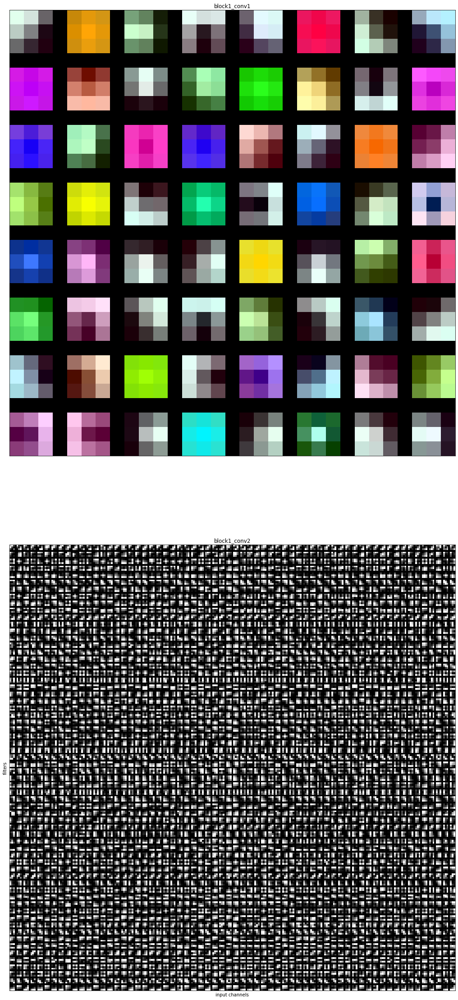

In [48]:
visualization.viz_conv_filters(vgg, ["block1_conv1", "block1_conv2"])

<a id='activations'></a>
## Visualize conv and pool activations
Visualizes the output of conv and pooling layers given an input image, showing how the image information is captured and decomposed in different filters. Each layer is formed by a number of 2D filters. The activation of each filter is shown as a separate image.
Note that the target image is preprocessed by applying the same transformations used for the training images, thus ensuring proper results. This is done by passing the VGG16 preprocessing function as argument for `f_preproc`:

/home/marco/dev/dlviz/visual-keras/visual_keras/visualization.py:90: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


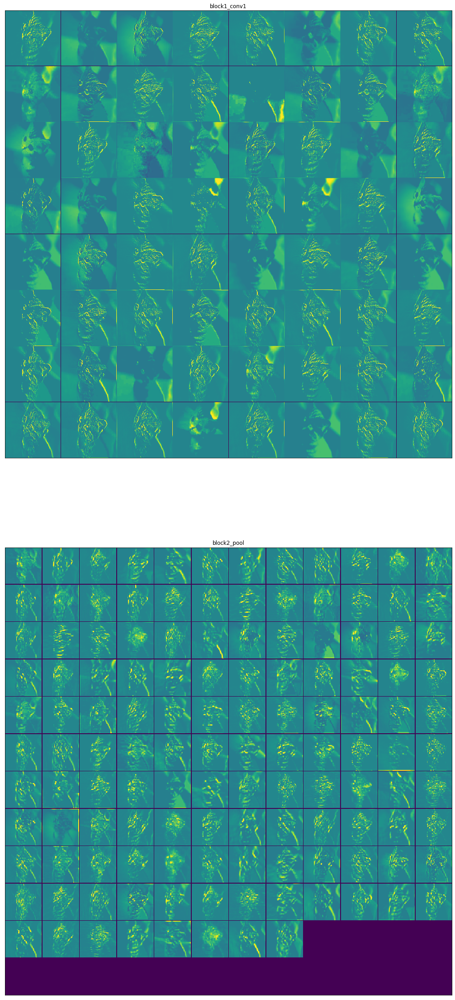

In [3]:
visualization.viz_activations("./images/kitten.jpg",
                vgg,
                ["block1_conv1", "block2_pool"],
                img_size=(224, 224),
                f_preproc=preprocess_input,
                fig_size=(40,40))

<a id='knn'></a>
## Visualize nearest neighbors
Finds the images that are most similar to a target image in the feature space defined by the output of a specified layer. If the layer's output is multi-dimensional, it is flattened into a one-dimensional array before similarity is computed. Euclidean distance is used as similarity measure.
Each row of the visualization shows the target image in the first column, and the top _k_ most similar images, ranked from left to right, in the ramaining columns.

This technique was first described in the paper:<br>
[Imagenet classification with deep convolutional neural networks]( https://dl.acm.org/citation.cfm?id=3065386) by A. Krizhevsky , I. Sutskever , G. E. Hinton. 

This technique can be used to check if the layers of the network are capable of capturing high-level class regularities that the original image space is not able to capture, as shown in the example below. 

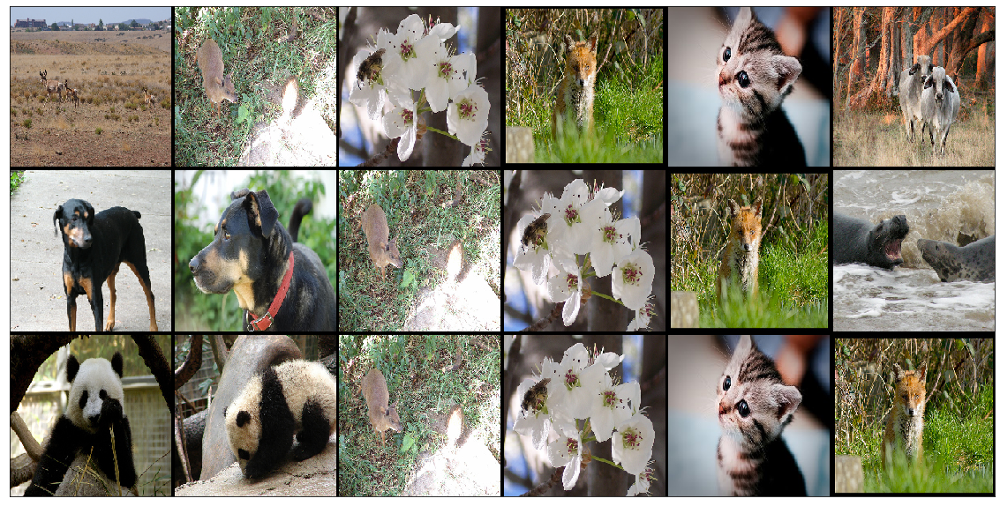

In [3]:
# image simialarity based on the feature space of the last layer  
import glob

target_images =["images/n02419796_11570_antelope.jpg", "images/doberman.png", "images/n02510455_7939_giant_panda.jpg"]
index_images = list(set(glob.glob("images/*")) - set(target_images))

visualization.viz_nearest_neighbors(target_images,
                                    index_images,
                                    vgg,
                                    "fc1",
                                    k=5,
                                    img_size=(224, 224, 3),
                                    f_preproc=preprocess_input,
                                    fig_size=(20,60))

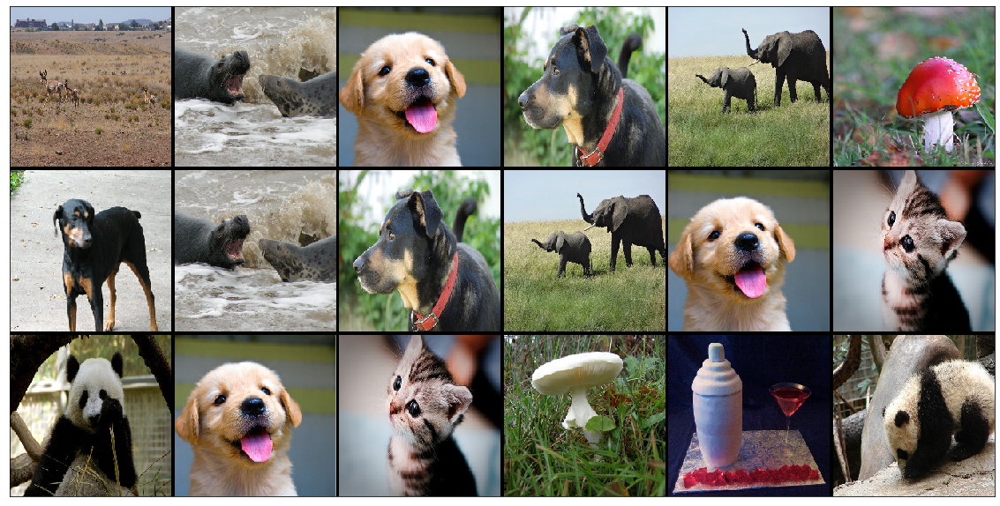

In [4]:
# image simialarity based on the original image feature space  

target_images =["images/n02419796_11570_antelope.jpg", "images/doberman.png", "images/n02510455_7939_giant_panda.jpg"]
index_images = list(set(glob.glob("images/*")) - set(target_images))
visualization.viz_nearest_neighbors(target_images,
                                    index_images,
                                    vgg,
                                    "block1_conv1",
                                    k=5,
                                    img_size=(224, 224, 3),
                                    f_preproc=preprocess_input,
                                    fig_size=(20,60))

<a id='maximize'></a>
## Maximal image generation

This technique generates the image that maximizes the activation of a neuron or a filter, and it was introduced in:

[Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps](https://arxiv.org/abs/1312.6034) by K. Simonyan, A. Vedaldi, A. Zisserman. 


The underlying idea is that the generated image best describes the information and patterns that the neuron is able to capture. The image is generated by starting with a random image and then performing gradient ascent, where we maximize the value of the target neuron's activation by adjusting the values of the pixel of the image. The weights of the network are kept fixed during the process.

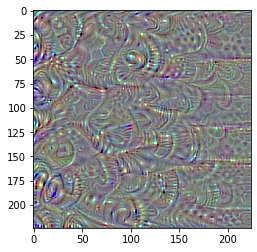

In [4]:
image = activation_maximization.image_filter_maximizer(vgg, "block5_conv2", 1, img_size=(224, 224, 3),
                                                       lrate=10, epochs=10)
image = utils.floats_to_pixels_standardized(image)
plt.imshow(image)
plt.show()

In alternative to the above code, the `visualization` module can be used to directly display images for multiple filters.
Here below we find the maximal images for the first 8 filters of the _block 5 conv 2_ layer.
We set `disc_dead = True` to discard images whose generating filter ends up having zero activation, since in this case the gradient cannot backpropagate and therefore the image does not react to gradient ascent.

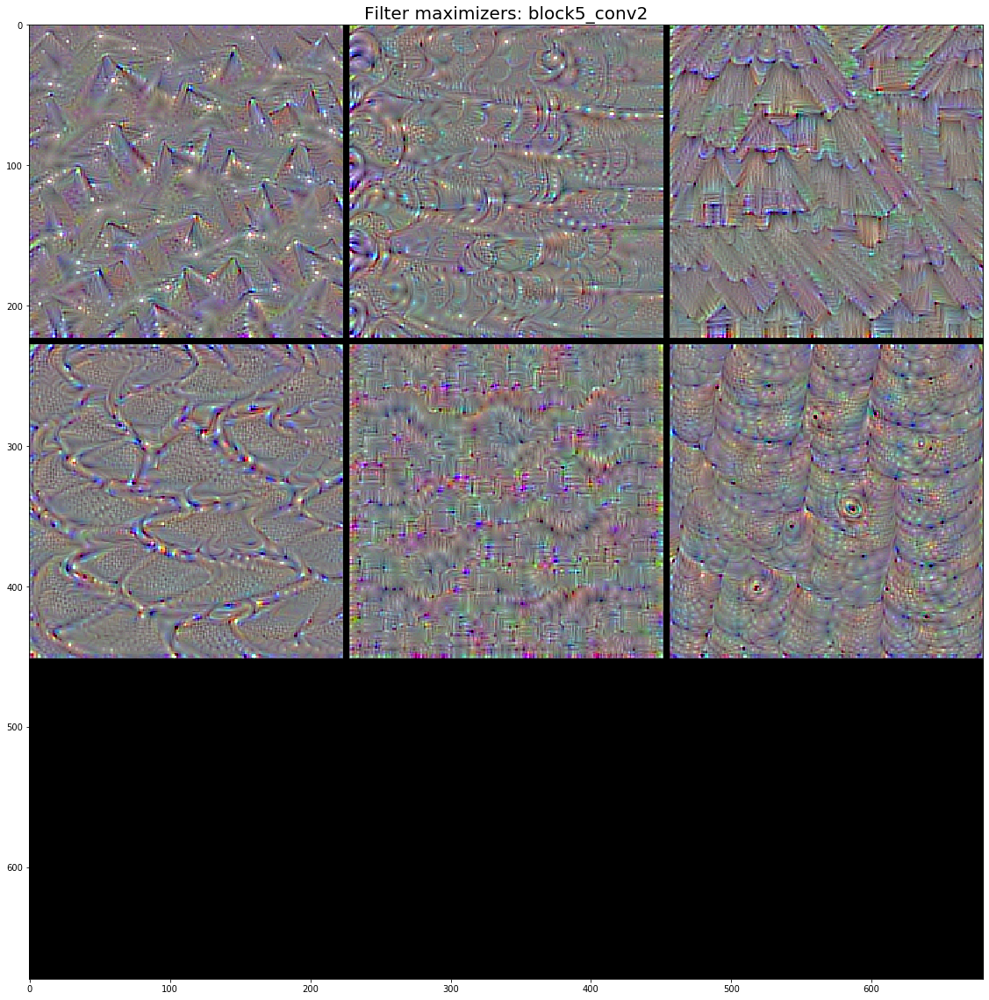

In [40]:
visualization.viz_layer_maximizers(resnet, "block5_conv2", img_size=(224, 224, 3), filters=[0,1,2,3,4,5,6,7,8],
                                   lrate=1, epochs=100, disc_dead=True)

This technique can also be applied to the neuron of the last layer that produces the class score. 
In such case the generated image represents the _prototypical image_ that the network has discovered for that class.
For example, here below we find the prototypical image for the Imagenet class _flamingo_ (class index in the last layer of VGG is 130).

Note that, as reported in Simonyan's paper, gradient ascent has to be applied to the unnormalizes class score, i.e. before sigmoid/softmax application, otherwise the visualization will not be optimal.
The `remove_activation=True` can be used to remove the activation function of the last layer, if needed.

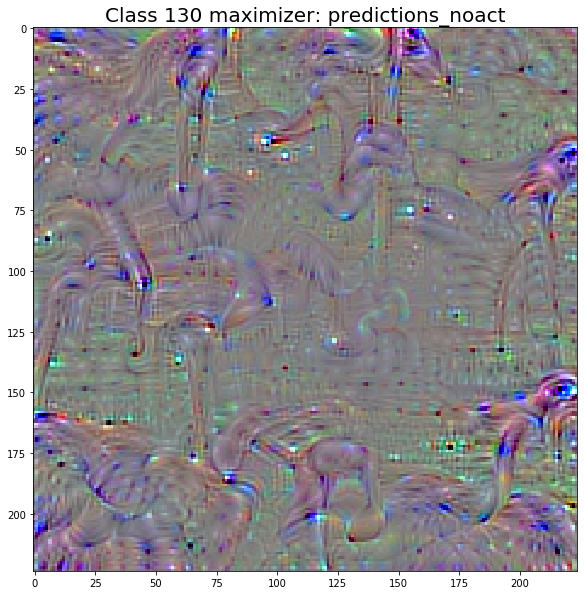

In [7]:
visualization.viz_class_score_maximizer(vgg, 130, img_size=(224, 224, 3), lrate=10, epochs=300, remove_activation=True)

In [25]:
x = utils.preproc_image("./images/kitten.jpg", img_size=(224, 224, 3), f_preproc=preprocess_input)


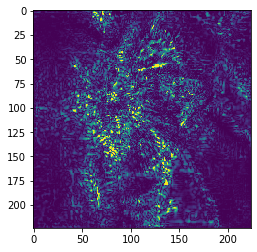

In [12]:
base_saliency = saliency.BaseSaliencyMap(vgg, multiply=True)
a = base_saliency.get_map(x, 281)
plt.imshow(a)
plt.show()

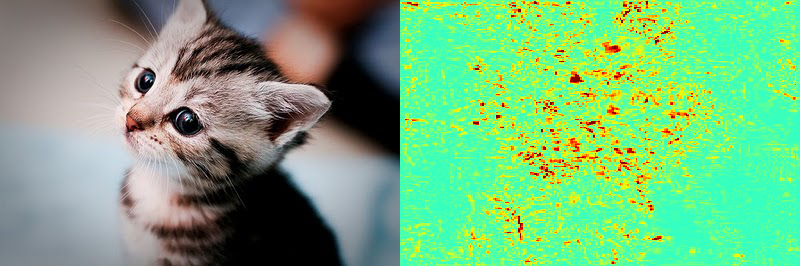

In [14]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="vanilla",
                 multiply=False, pair=True)

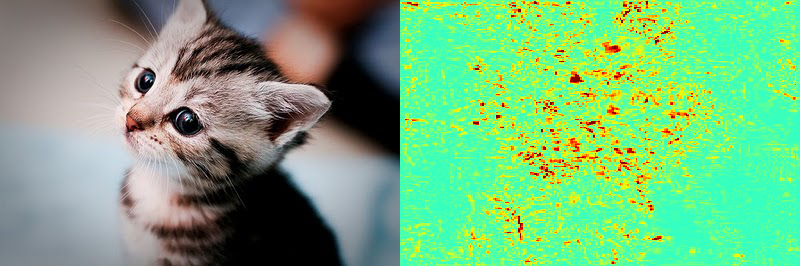

In [17]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="vanilla",
                 multiply=False, pair=True)

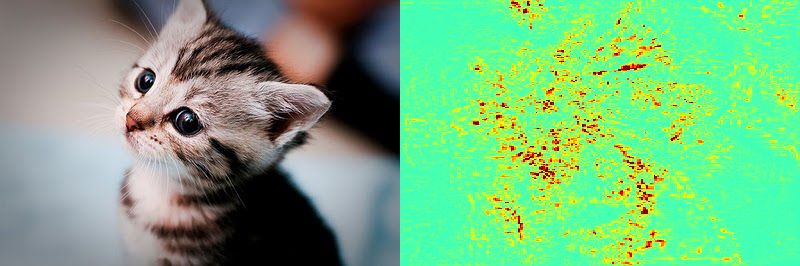

In [18]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="vanilla",
                 multiply=True, pair=True)

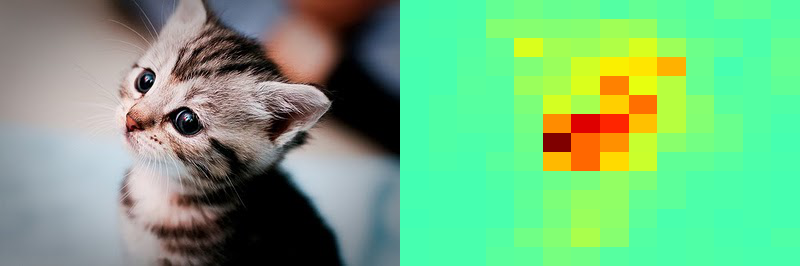

In [19]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="vanilla",
                 layer_name="block5_conv1", multiply=True, pair=True)

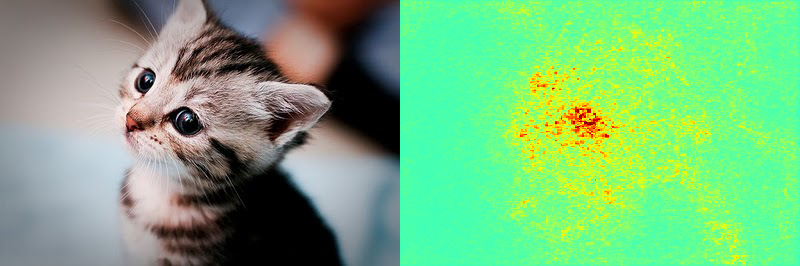

In [20]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="smooth",
                 multiply=False, pair=True, samples=5, spread=0.2)

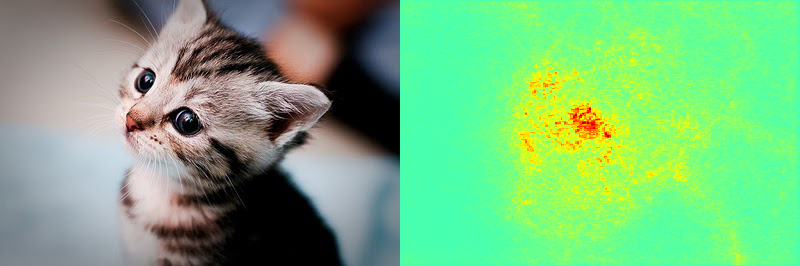

In [21]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="smooth",
                 multiply=False, pair=True, samples=15, spread=0.2)

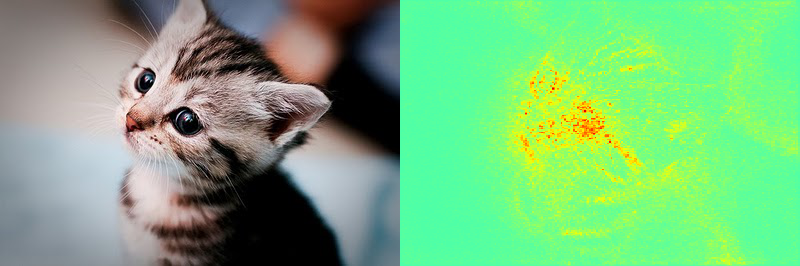

In [23]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="smooth",
                 multiply=True, pair=True, samples=15, spread=0.2)

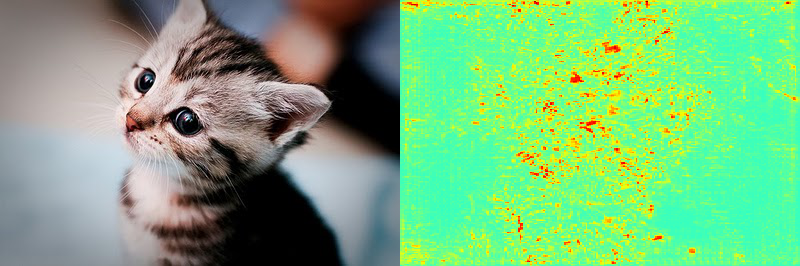

In [24]:
visualization.viz_saliency_map("./images/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="integrated",
                 multiply=False, pair=True, samples=5)

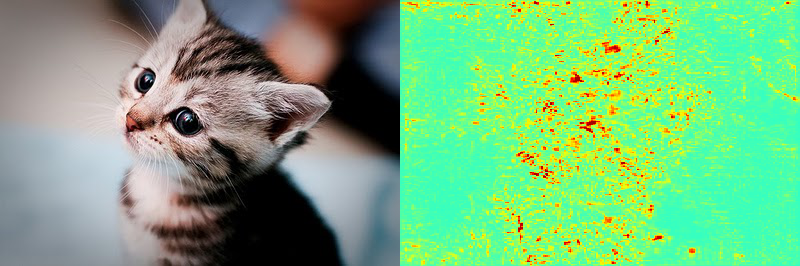

In [11]:
viz_saliency.viz_saliency_map("/devel/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="integrated",
                 multiply=False, pair=True, samples=20)

/devel/rtc/visual_keras/saliency/base_saliency.py:59: RuntimeWarning: invalid value encountered in true_divide
  smap /= smap.max()


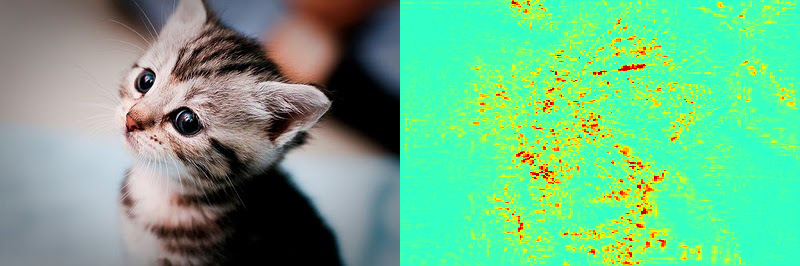

In [12]:
viz_saliency.viz_saliency_map("/devel/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="integrated",
                 multiply=True, pair=True, samples=20)

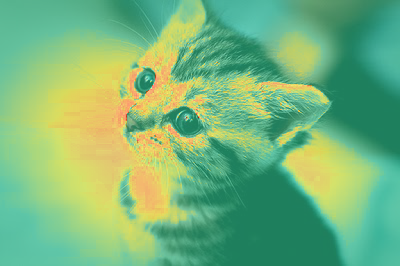

In [13]:
viz_saliency.viz_saliency_map("/devel/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="gradcam",
                 multiply=False, blend=True)

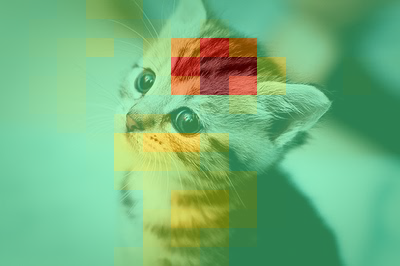

In [14]:
viz_saliency.viz_saliency_map("/devel/kitten.jpg", vgg, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="gradcam",
                 layer_name="block5_conv3", multiply=False, blend=True)

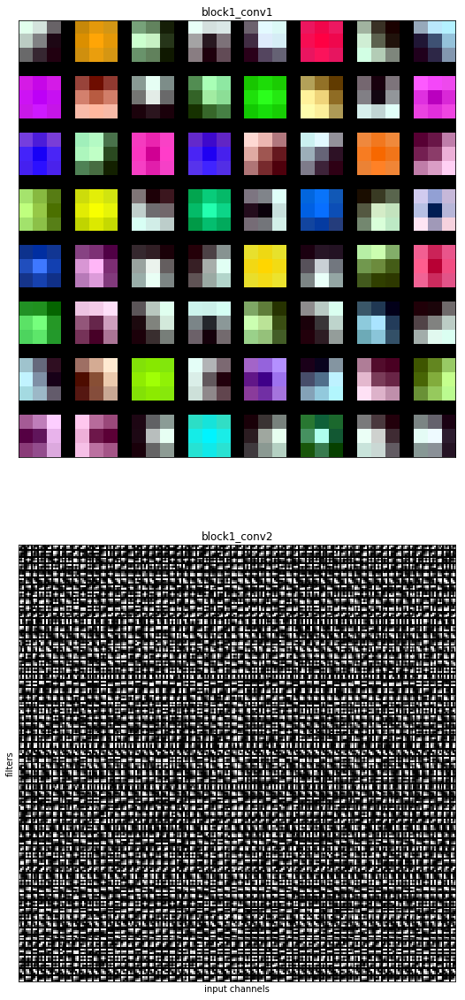

In [31]:
viz_filters.viz_conv_filters(vgg, ["block1_conv1", "block1_conv2"])

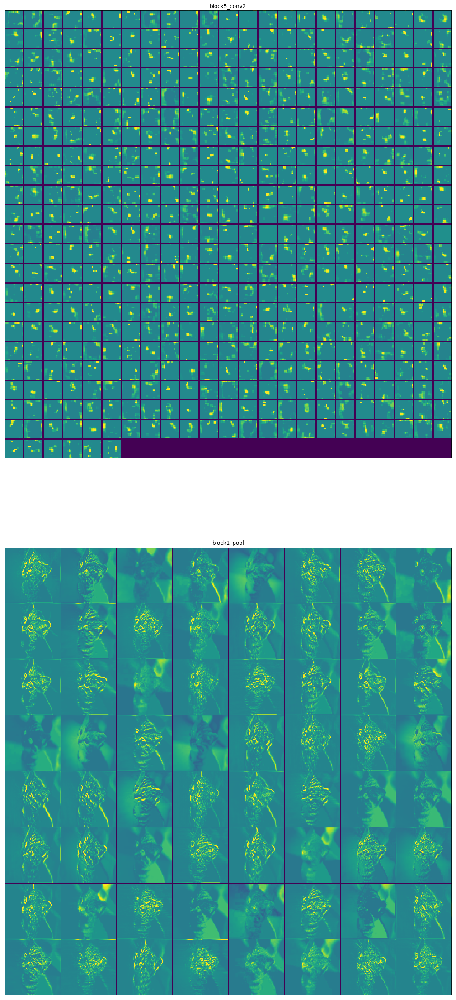

In [3]:
image_path = "/devel/kitten.jpg"

viz_activations.viz_activations(image_path,
                vgg,
                ["block5_conv2", "block1_pool"],
                img_size=(224, 224),
                f_preproc=preprocess_input,
                fig_size=(40,40))

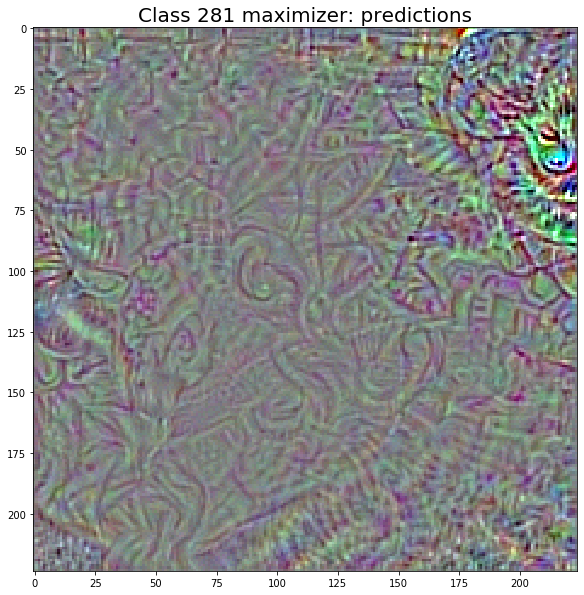

In [14]:
# image that maximizes urban roads
visualization.viz_class_score_maximizer(vgg, "predictions", 281, img_size=(224, 224, 3), lrate=25, epochs=100)

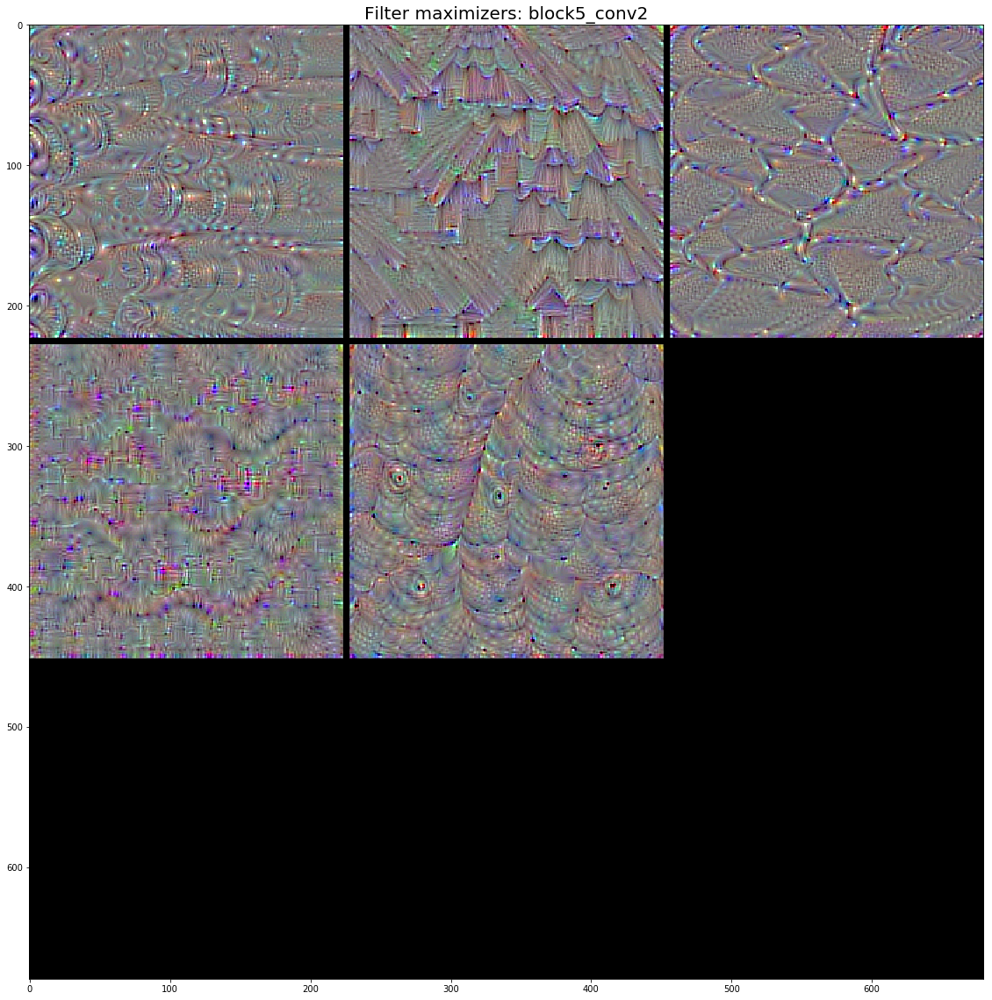

In [89]:
# "empty" random filter activations are due to 0 loss, i.e. activation value, due to "dead" neuron effect (since relu is used in conv layers in vgg)
viz_layer_maximizers(vgg, "block5_conv2", img_size=(224, 224, 3),
                     filters=[1,2,3,4,5,6,7,8], lrate=1, epochs=100, disc_dead=True)

In [2]:
from keras.applications.inception_v3 import InceptionV3, preprocess_input

inc3 = InceptionV3(include_top=True, weights="imagenet")
inc3.summary()

Instructions for updating:
Colocations handled automatically by placer.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
_____________________________________

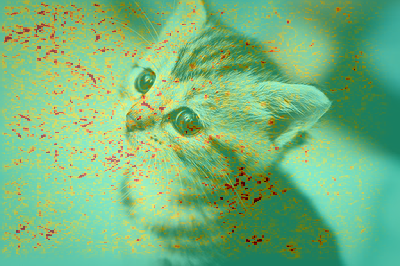

In [4]:
visualization.viz_saliency_map("./images/kitten.jpg", inc3, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="vanilla",
                 multiply=False, blend=True)

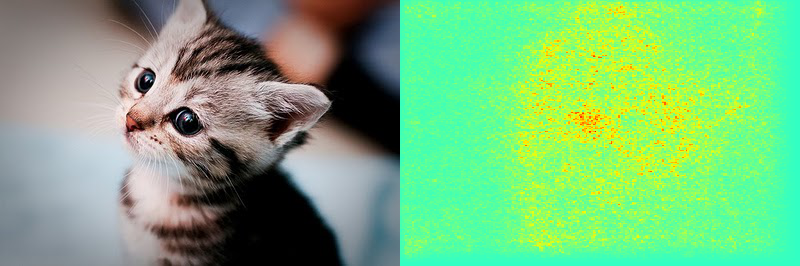

In [5]:
visualization.viz_saliency_map("./images/kitten.jpg", inc3, 281, img_size=(224, 224, 3), f_preproc=preprocess_input, variant="smooth",
                 multiply=False, pair=True, samples=5, spread=0.2)

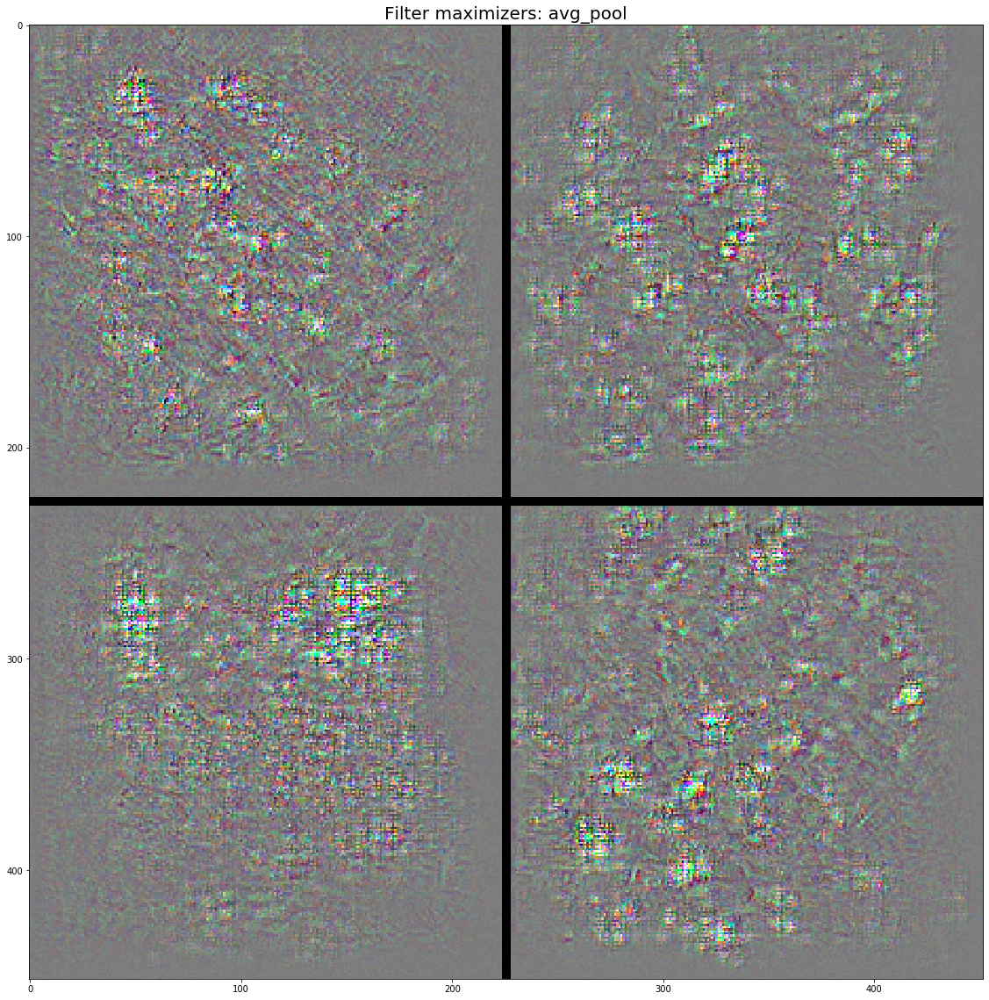

In [6]:
visualization.viz_layer_maximizers(inc3, "avg_pool", img_size=(224, 224, 3),
                     filters=[1,2,3,4,5], lrate=5, epochs=60, disc_dead=True)

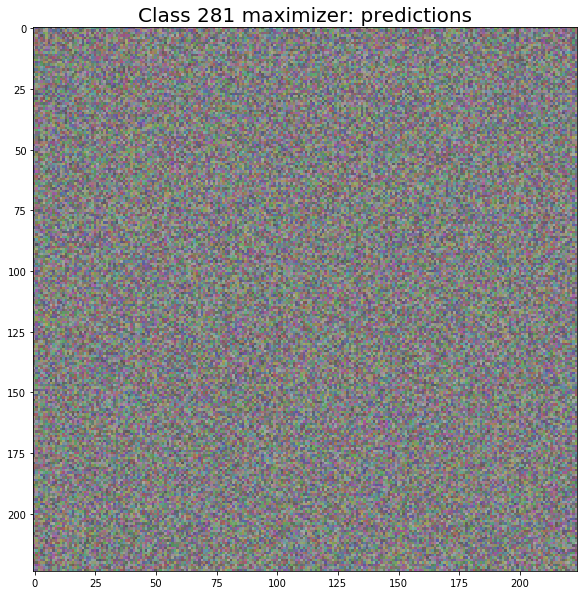

In [9]:
visualization.viz_class_score_maximizer(inc3, "predictions", 281, img_size=(224, 224, 3),
                     lrate=15, epochs=60, disc_dead=True)